<a href="https://colab.research.google.com/github/TomJZ/RandomWalk2SDEs/blob/master/RandomWalk_to_SDEs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from scipy import io
import numpy as np
from scipy.special import comb
from matplotlib import pyplot as plt
import pandas as pd
from scipy.integrate import odeint
from matplotlib import animation
import matplotlib
import time
import sys
import math
from matplotlib import animation, rc, rcParams
from IPython.display import HTML
import time
import csv
from IPython.display import display
from IPython.display import clear_output
from google.colab import drive
drive.mount('/content/drive')

# Simple Random Walk

In [ ]:
"""
Describe the dynamics of a 1D simple random walk
where n_steps is the number of times the dot steps
"""
def generate_traj(n_steps):
  x = 0
  x_traj = []
  x_traj.append(x)
  for i in range(n_steps):
    x = x + (1 if np.random.randint(0,2)==0 else -1)
    x_traj.append(x)
  return x_traj

# Generate a trajectory for 1000 time steps
n_steps = 1000
x_traj = generate_traj(n_steps)

## Time evolution of the trajectory of simple random walk 
An animation is generated

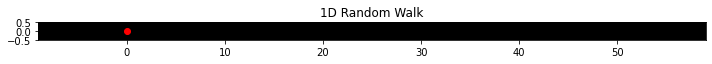

In [ ]:
SAVE_ANIM = True
rcParams['animation.embed_limit'] = 2**128 # Make the max size for embedded animation very large
fig = plt.figure(figsize=(10,1))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(np.min(x_traj), np.max(x_traj))
ax.set_ylim(-0.5,0.5)
ax.set_facecolor('black')
c = ax.scatter(x_traj[0], 0, marker='o', c="red")
ax.set_title('1D Random Walk')
fig.tight_layout()
plt.show()



def animate(i):  
  c.set_offsets([x_traj[i],0])
  return c,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=1000, interval=20, blit=True)

# save animation
if SAVE_ANIM:
  anim.save('1D Random Walk.mp4',writer=animation.FFMpegWriter(fps=30))

# show embedded animation
rc('animation', html='jshtml')
anim


## Time evolution of the probability distribution of simple random walk 

In [ ]:
# Special binomial distribution of 1D random walk
def prob(n,k):
  """
  n is time
  k is location on the line of integers
  """
  prob = np.abs(((-1)**n+(-1)**np.abs(k))/2)*comb(n,(n-k)/2)*(0.5)**np.abs(k)*(0.5)**(n-np.abs(k))
  return prob

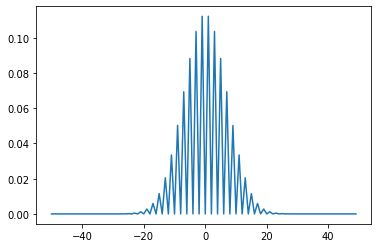

In [ ]:
# Generate the time evolution of the probability distribution of a random walk
int_len = 100
t_len = 300
t_arr = np.arange(0,t_len)
int_line = np.arange(-int(int_len/2),int(int_len/2))
prob_mat = np.zeros((t_len, int_len))

for i in range(int_len):
  for j in range(t_len):
    prob_mat[j,i] = prob(t_arr[j],int_line[i])


# example plot
plt.plot(int_line, prob_mat[49,:])

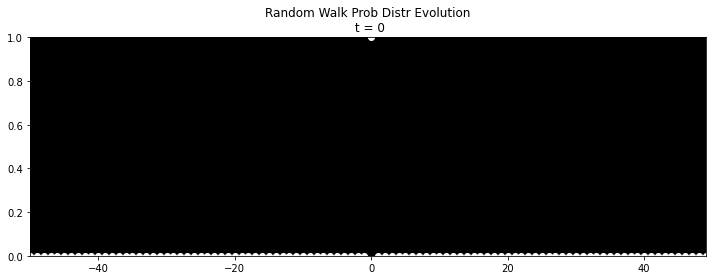

In [ ]:
SAVE_ANIM = True
rcParams['animation.embed_limit'] = 2**128 # Make the max size for embedded animation very large
fig = plt.figure(figsize=(10,4))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(np.min(int_line), np.max(int_line))
ax.set_ylim(0,1)
ax.set_facecolor('black')
c = ax.scatter(int_line, prob_mat[0,:], marker='o', c="white")
ax.set_title('Random Walk Prob Distr Evolution\n t = 0')
fig.tight_layout()
plt.show()


def animate(i):
  new_xy = np.array([int_line, prob_mat[i,:]])
  ax.set_title('Random Walk Prob Distr Evolution\n t = {0}'.format(i))
  c.set_offsets(new_xy.T)
  return c,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=299, interval=20, blit=True)


if SAVE_ANIM:
  anim.save('rw_p.mp4',writer=animation.FFMpegWriter(fps=50))


rc('animation', html='jshtml')
anim

## Visualizing both trajectory and probability distribution
Putting everything together for some very cool animation

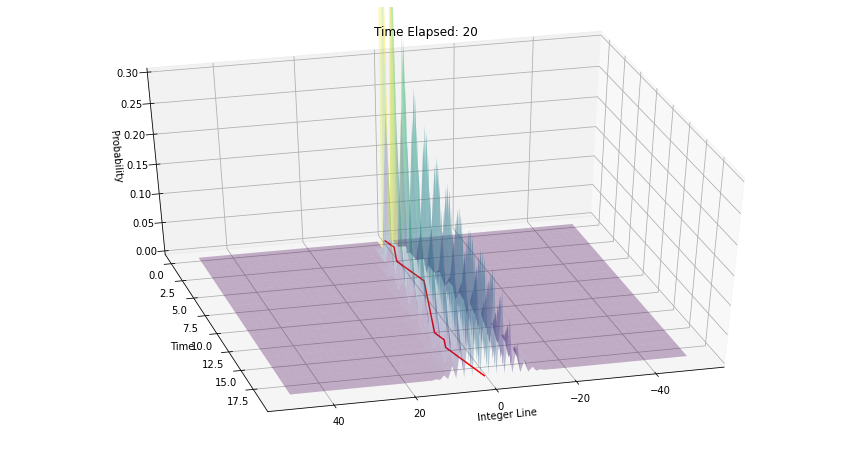

In [ ]:
n_steps = 20
sample_traj = generate_traj(n_steps)
SAVE = False

def plot_random_walk(i):
  fig = plt.figure()
  fig.set_size_inches(15, 8)
  ax = plt.axes(projection='3d')
  ax.set_zlim(0,0.3)
  ax.set_xlabel("Integer Line")
  ax.set_ylabel("Time")
  ax.set_zlabel("Probability")
  ax.view_init(40, 75)
  traj_for_plot = sample_traj[0:i+1]
  X, Y = np.meshgrid(int_line, t_arr[0:i+1])
  ax.set_title("Time Elapsed: {0}".format(i+1))
  ax.plot_surface(X, Y, prob_mat[0:i+1,:].reshape(i+1,-1), cmap='viridis', edgecolor='none', alpha=0.3)
  ax.plot(traj_for_plot, t_arr[0:i+1], c="red")
  if SAVE:
    plt.savefig("/content/drive/My Drive/temp/randomWalk_sample_3_{0}.png".format(i))
  plt.show()


for i in range(n_steps):
  plot_random_walk(i)
  clear_output(wait=True)

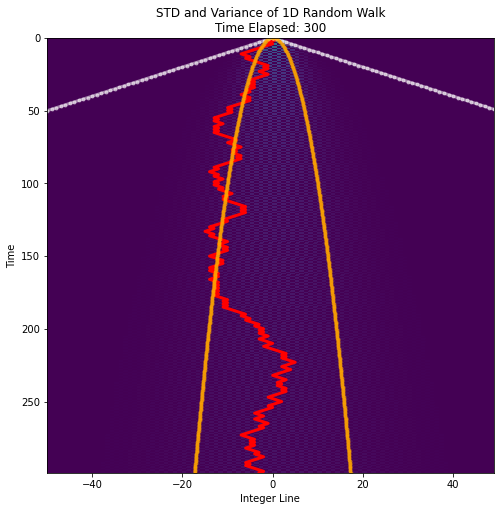

In [ ]:
n_steps = 300
np.random.seed(0)
sample_traj = generate_traj(n_steps)
SAVE = True

def plot_random_walk(i):
  fig = plt.figure()
  fig.set_size_inches(8, 8)
  ax = plt.axes()
  ax.set_xlabel("Integer Line")
  ax.set_ylabel("Time")
  ax.set_xlim(-50,49)
  ax.invert_yaxis()
  traj_for_plot = sample_traj[0:i+1]
  X, Y = np.meshgrid(int_line, t_arr[0:i+1])
  ax.set_title("STD and Variance of 1D Random Walk\nTime Elapsed: {0}".format(i+1))
  ax.pcolor(X, Y, prob_mat[0:i+1,:].reshape(i+1,-1), cmap='viridis', edgecolor='none', alpha=1)
  ax.plot(traj_for_plot, t_arr[0:i+1], c="red", linewidth = 3)
  ax.plot(t_arr[0:i+1], t_arr[0:i+1], c="white", marker=".", linewidth = 3, alpha = 0.5)
  ax.plot(-t_arr[0:i+1], t_arr[0:i+1], c="white", marker=".", linewidth = 3, alpha = 0.5)
  ax.plot(np.sqrt(t_arr[0:i+1]), t_arr[0:i+1], c="orange", marker=".", linewidth = 3, alpha = 0.5)
  ax.plot(-np.sqrt(t_arr[0:i+1]), t_arr[0:i+1], c="orange", marker=".", linewidth = 3, alpha = 0.5)
  if SAVE:
    plt.savefig("/content/drive/My Drive/tmp/randomWalk_sample_top_var_{0}.png".format(i))
  plt.show()


for i in range(n_steps):
  plot_random_walk(i)
  clear_output(wait=True)